# Машинное обучение, DS-поток, осень 2022
# Задание 3.1. Кластеризация

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from warnings import filterwarnings
import matplotlib

sns.set(palette='Set2')

In [2]:
filterwarnings('ignore', category=FutureWarning)
sns.set(style='white', font_scale=1.5)

### Задача 1 

Докажите, что в методе k-means кластеры образуют выпуклые множества. Выполняется ли данное свойство для кластеров, определеяемых гауссовской смесью? Под кластером имеется в виду область пространства признаков.

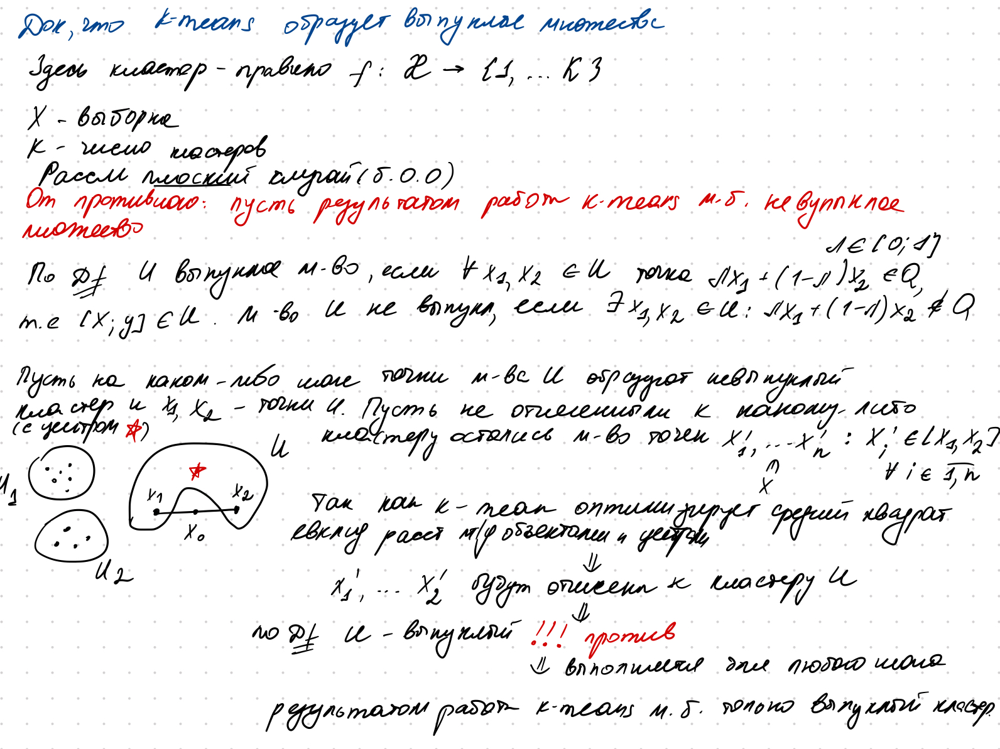

*Это свойство будет также выполняться для гауссовской смеси, так в этом случае в качестве поиска расстояний от объектов до центров (принадлежности к кластерам) будут оцениваться вероятности принадлежности к кластерам, а в качестве поиска центров кластеров будут оцениваться параметры, задающие распределения кластеров, а эти действия эквивалентны.*

### Задача 2 
Проведите свое исследование датасета из `data.txt` на кластеризацию изученными методами, реализованными в sklearn:

- k-means;
- DBSCAN;
- Иерархическая кластеризация.

Для каждого метода выше обоснуйте, почему выбранные вами гиперпараметры оптимальны, исходя из внутренней структуры данных. Если вы не можете применить какой-то из методов на этих данных, то обоснуйте, почему.

*Примечание.* Задача является небольшим упражнением и не предполагает большое исследование.

In [3]:
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.preprocessing import StandardScaler

In [4]:
data = np.loadtxt('data.txt')
data = pd.DataFrame(data)

*Визуализируем данные, чтобы увидеть кластеры. 
Примечание: в маленьком масштабе все точки лежали близко и кластеры не выделялись. Важно было попробовать большой масштаб, чтобы они вырисовались*

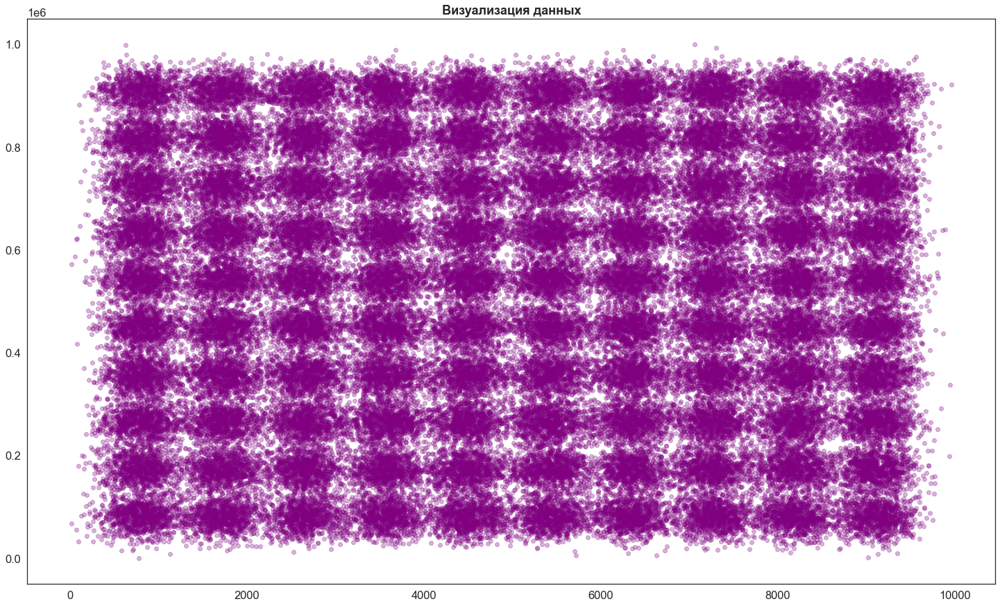

In [875]:
plt.figure(figsize=(25, 15))
plt.scatter(data.iloc[:, 0], data.iloc[:, 1], alpha=0.3, c='purple')
plt.title('Визуализация данных', fontweight='bold');

*Отчетливо видны 100 кластеров. Будем использовать это количество как параметр в кластеризации*

***1. K-means***

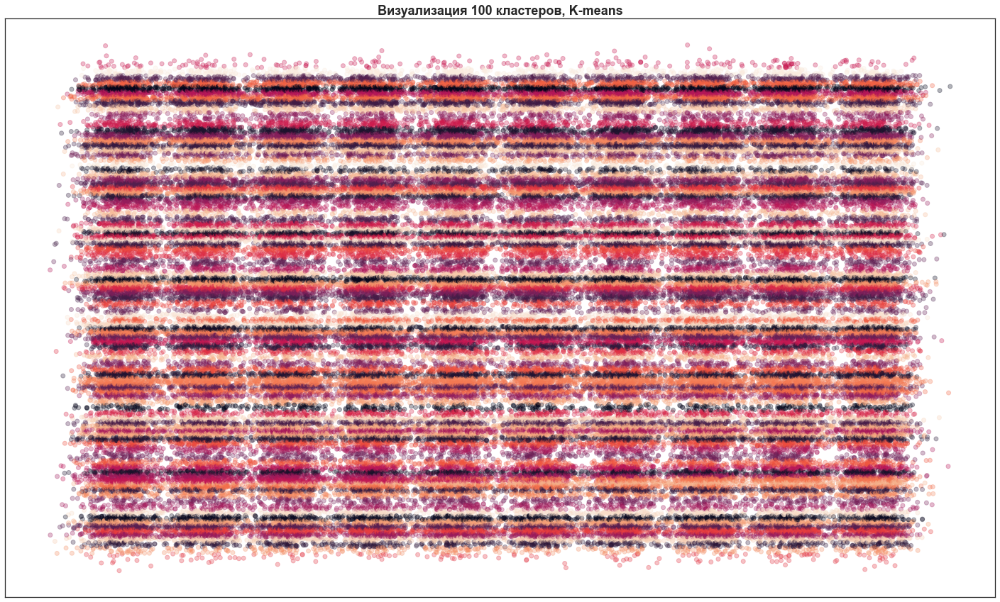

In [876]:
plt.figure(figsize=(25, 15))

kmeans = KMeans(n_clusters=100)
kmeans.fit(data)
y_pred = kmeans.predict(data)

# Визуализация
plt.scatter(data.iloc[:, 0], data.iloc[:, 1], c=y_pred, alpha=0.3)
plt.title(f'Визуализация {100} кластеров, K-means', fontweight='bold')
plt.xticks([]), plt.yticks([]);

*Попробуем стандартизировать данные, так как видно, что у них большой разброс*

In [5]:
data_std = StandardScaler().fit_transform(data)
data_std = pd.DataFrame(data_std)

In [6]:
plt.figure(figsize=(25, 15))
kmeans = KMeans(n_clusters=100)
kmeans.fit(data_std)
y_pred = kmeans.predict(data_std)

# Визуализация
plt.scatter(data_std.iloc[:, 0], data_std.iloc[:, 1], c=y_pred, alpha=0.3)
plt.title(f'Визуализация {100} кластеров со стандартизацией, K-means', fontweight='bold')
plt.xticks([]), plt.yticks([]);

KeyboardInterrupt: 

<Figure size 1800x1080 with 0 Axes>

*После стандартизации выделяются почти те же кластеры, что и видны на картинке данных изначально. Несколько кластеров немного другой формы, но основное количество совпадает.*

***2. DBSCAN***

*Попробуем разные гиперпараметры, чтобы определить при каких кластеризация ближе к желаемой*

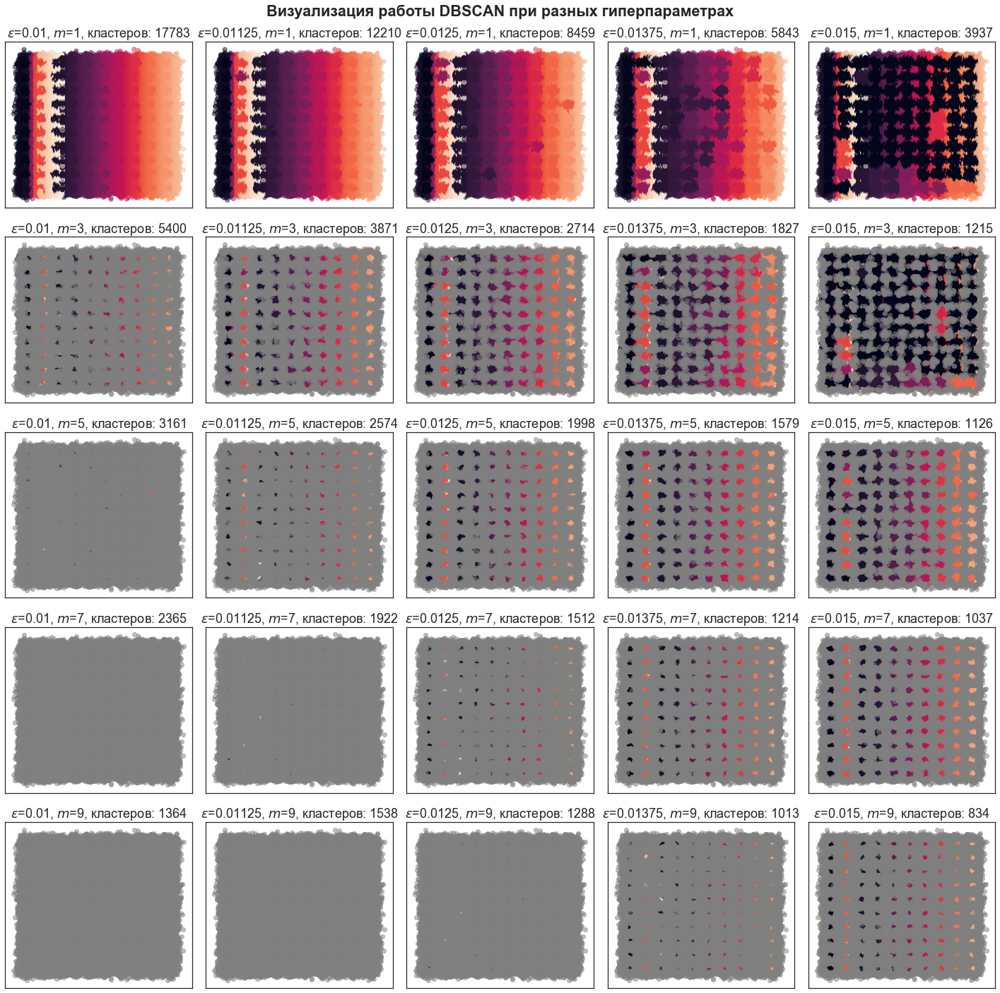

In [879]:
# Сетка параметров
eps, min_samples = np.meshgrid(
    np.linspace(0.01, 0.015, 5), np.arange(1, 10, 2))

fig = plt.figure(figsize=(20, 20))
for i in range(5):
    for j in range(5):
        
        # Применение метода
        dbscan = DBSCAN(eps=eps[i, j], min_samples=min_samples[i, j])
        y_pred = dbscan.fit_predict(data_std)
        outliers = (y_pred == -1)
        
        # Визуализация
        plt.subplot(5, 5, i * 5 + j + 1)
        plt.scatter(data_std.iloc[~outliers, 0], data_std.iloc[~outliers, 1], 
                    c=y_pred[~outliers], alpha=0.5)
        plt.scatter(data_std.iloc[outliers, 0], data_std.iloc[outliers, 1], 
                    c='gray', alpha=0.5)
        plt.title(
            f'$\\varepsilon$={eps[i, j]}, $m$={min_samples[i, j]}, кластеров: {len(set(y_pred))}')
        
        plt.xticks([]), plt.yticks([])
        
fig.suptitle('Визуализация работы DBSCAN при разных гиперпараметрах', fontweight='bold')
plt.tight_layout()

*Видим, что в этом методе кластеров получается слишком много, а так же много точек считается шумом.*

In [10]:
y_pred

array([ 0,  1,  2, ..., 73, 86, -1])

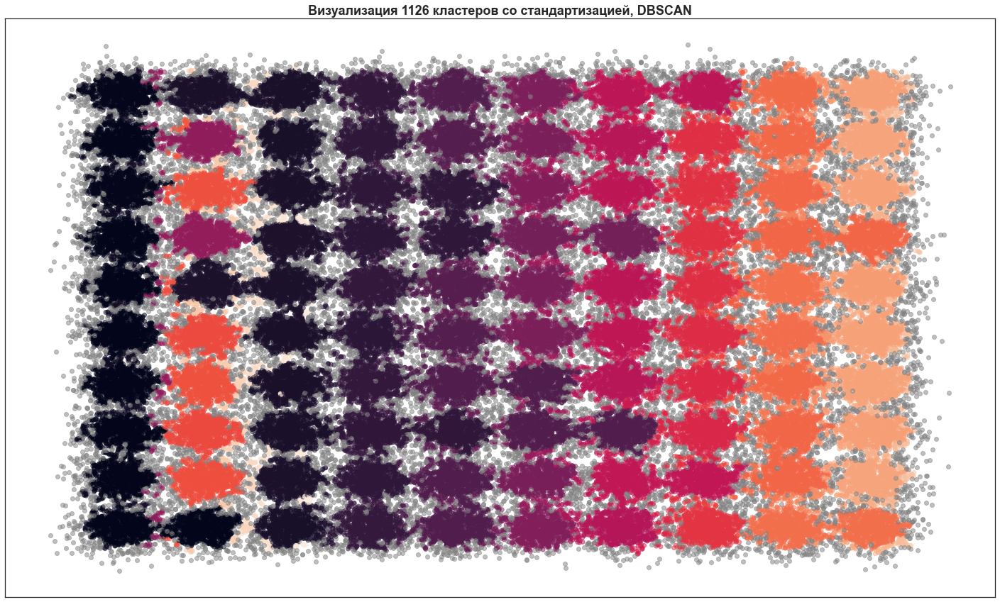

In [7]:
plt.figure(figsize=(25, 15))

dbscan = DBSCAN(eps=0.015, min_samples=5)
y_pred = dbscan.fit_predict(data_std)
outliers = (y_pred == -1)

# Визуализация
plt.scatter(data_std.iloc[~outliers, 0], data_std.iloc[~outliers, 1], 
            c=y_pred[~outliers], alpha=0.5)
plt.scatter(data_std.iloc[outliers, 0], data_std.iloc[outliers, 1], 
            c='gray', alpha=0.5)

plt.title(f'Визуализация {len(set(y_pred))} кластеров со стандартизацией, DBSCAN', fontweight='bold')
plt.xticks([]), plt.yticks([]);

**Вывод**:
*С текущим датасетом ожидаемый результат (100 кластеров) дает только метод K-means.
Плохой результат DBSCAN объясняется природой данных. Этот алгоритм основан на плотности, а в нашем случае граничные точки соседних кластеров лежат очень плотно - а значит алгоритм хуже определяет обособленные участки.
Также невозможно получить 100 кластеров с помощью иерархической кластеризации - это слишком большая глубина рекурсии и слишком большой датасет для этого метода, поэтому я его не использовала.*

### Задача 3
Скачайте <a href="https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis">данные</a> о клиентах некоторой торговой сети.

Цель задачи &mdash; кластеризовать клиентов с целью модификации продукта под разные типы пользовательских кластеров. Например, вместо того, чтобы тратиться на продвижение нового продукта каждому клиенту, можно продавать продукт только в том кластере, где клиенты с наибольшей вероятностью его купят.

In [881]:
data = pd.read_csv("./marketing_campaign.csv", sep="\t")
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


Посмотрим на признаки. Прочитайте также информацию о признаках на странице данных.

In [882]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

Посмотрим на диапазон дат регистрации

*P.S Тут пришлось переставить и изменить исходный код, так как он неверно парсил дату*

In [883]:
data["Dt_Customer"] = pd.to_datetime(data["Dt_Customer"], format="%d-%m-%Y")

In [884]:
data["Dt_Customer"].min(), data["Dt_Customer"].max()

(Timestamp('2012-07-30 00:00:00'), Timestamp('2014-06-29 00:00:00'))

Кажется, данные выгружены в конце 2014 года, соответственно, определим дату анализа

In [885]:
data[data["Dt_Customer"] == data["Dt_Customer"].max()]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
200,7300,1952,Graduation,Divorced,69142.0,0,1,2014-06-29,50,448,...,5,0,1,0,0,0,0,3,11,0
989,453,1956,PhD,Widow,35340.0,1,1,2014-06-29,1,27,...,5,0,0,0,0,0,0,3,11,0


*P.S Последняя регистрация была в конце июня 2014 года, поэтому дата анализа может быть любой после минимум 50 дней со дня последней регистрации (это пользователь с ID == 7300). Поэтому я оставлю исходную дату анализа*

In [886]:
end_date = pd.Timestamp('2015-01-01')

Посчитаем для каждого клиента количество дней с момента регистрации

In [887]:
data["usage_time"] = (end_date - data["Dt_Customer"]) / pd.Timedelta('1 day')
data["usage_time"]

0       849.0
1       299.0
2       498.0
3       325.0
4       347.0
        ...  
2235    567.0
2236    205.0
2237    341.0
2238    342.0
2239    808.0
Name: usage_time, Length: 2240, dtype: float64

Создайте следующие признаки:
* возраст клиента на основе даты рождения
* сумма покупок по всем категориям
* общее количество детей, сложив `Kidhome` и `Teenhome`
* на основе количества детей и семейного положения (`Marital_Status`) определите *предполагаемый* размер семьи
* средние траты клиента в день в период пользования сервисом, поделив суммарные траты на количество дней от даты регистрации (*см. примечание далее*)

In [888]:
data['age'] = 2014 - data['Year_Birth'] # полных лет учитывая дату анализа

purchase_categories = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
data['spent_total'] = data[purchase_categories].sum(axis=1)

data["children"] = data["Kidhome"] + data["Teenhome"]

data['family_size'] = data['children'] + data['Marital_Status'].apply(lambda x: 2 if x in ['Together', 'Married'] else 1)
data['spent_average'] = data['spent_total'] / data["usage_time"]

data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Complain,Z_CostContact,Z_Revenue,Response,usage_time,age,spent_total,children,family_size,spent_average
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,3,11,1,849.0,57,1617,0,1,1.904594
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,3,11,0,299.0,60,27,2,3,0.090301
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,3,11,0,498.0,49,776,0,2,1.558233
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,0,3,11,0,325.0,30,53,1,3,0.163077
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,0,3,11,0,347.0,33,422,1,3,1.216138


*Примечание.* 

Клиент может перестать пользоваться сервисом спустя какое-то время, поэтому корректнее было бы делить на время пользования сервисом. В данных не сказано о том, в каких случаях клиента можно отнести в отток, а так же не указан принцип выгрузки данных (все клиенты или только активные), но имеется признак `Recency` &mdash; количество дней с момента последней покупки клиента. 

Исследуйте этот признак и попробуйте понять, можно ли из данных сделать вывод о том, какие типы клиентов присутствуют в данных, каких клиентов можно отнести в отток. Если это сделать удалось, то при вычислении средних трат клиента в день делить нужно на количество дней использования сервиса в случае, если клиент попал в отток. Если клиент активен, то мы считаем, что он до сих пор пользуется сервисом, даже если последнюю покупку он совершал несколько дней назад.

*Посмотрим, какие значения есть в Recency*

In [889]:
np.sort(data['Recency'].unique())

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])

*Это кол-во дней от 1 до 99. Также, так как мы сами обозначаем дату анализа, убираем записи, в которых `Recency` > `usage_time`*

In [890]:
data.drop(data[data['Recency'] > data["usage_time"]].index, inplace=True)

*Также проверим насколько часто встречается большое значение `Recency`*

In [891]:
print('Процент пользователей c recency > 80:', round(data[data['Recency'] > 80].shape[0] / data.shape[0] * 100), '%')

Процент пользователей c recency > 80: 19 %


*Почти 20% пользователей не пользовались сервисом более 80 дней. Только по этому признаку клиентов разделить нельзя*

*В интернет статье про отток клиентов в бизнесе сказано, что чаще всего оттоку предшествует жалоба на сервис. Будем считать ушедшими клиентов, которые не пользовались сервисом более 80 дней и при этом оставляли жалобу*

In [892]:
data[(data['Recency'] > 80) & (data['Complain'])]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Complain,Z_CostContact,Z_Revenue,Response,usage_time,age,spent_total,children,family_size,spent_average
192,7829,1900,2n Cycle,Divorced,36640.0,1,0,2013-09-26,99,15,...,1,3,11,0,462.0,114,65,1,2,0.140693
1041,6730,1954,Graduation,Married,38998.0,1,1,2012-11-03,92,34,...,1,3,11,0,789.0,60,54,2,4,0.068441
1069,2875,1978,Graduation,Married,67023.0,0,0,2014-03-04,93,444,...,1,3,11,0,303.0,36,906,0,2,2.990099
1571,9916,1954,Graduation,Married,38998.0,1,1,2012-11-03,92,34,...,1,3,11,0,789.0,60,54,2,4,0.068441
1720,6742,1979,Graduation,Married,17688.0,1,0,2013-01-13,82,2,...,1,3,11,0,718.0,35,11,1,3,0.015320


*Примечание: этот критерий я придумала сама, однозначно подтвердить это другими признаками в датасете нельзя. Но я его использую, так ваше предлоположение действительно логично, и скорее всего в любом бизнесе есть критерий, по которому пользователь будет считаться в оттоке.*

In [893]:
data.loc[(data['Recency'] > 80) & (data['Complain']), 'left'] = True
data['left'].fillna(False, inplace=True)

data.loc[data[data['left']].index, 'usage_time'] = data['usage_time'] - data['Recency']

In [894]:
data['spent_average'] = data['spent_total'] / data["usage_time"]

Далее будем работать с признаками:
* возраст клиента
* предполагаемый размер семьи
* средние траты клиента в день
* `Income` &mdash; годовой доход клиента

Проведите графическое исследование признаков. При необходимости выполните предобработку, обосновав ее необходимость.

In [895]:
data_fc = data[['age', 'family_size', 'spent_average', 'Income']]

In [896]:
data_fc

,age,family_size,spent_average,Income
0,57,1,1.904594,58138.0
1,60,3,0.090301,46344.0
2,49,2,1.558233,71613.0
3,30,3,0.163077,26646.0
4,33,3,1.216138,58293.0
...,...,...,...,...
2235,47,3,2.365079,61223.0
2236,68,5,2.165854,64014.0
2237,33,1,3.639296,56981.0
2238,58,3,2.464912,69245.0


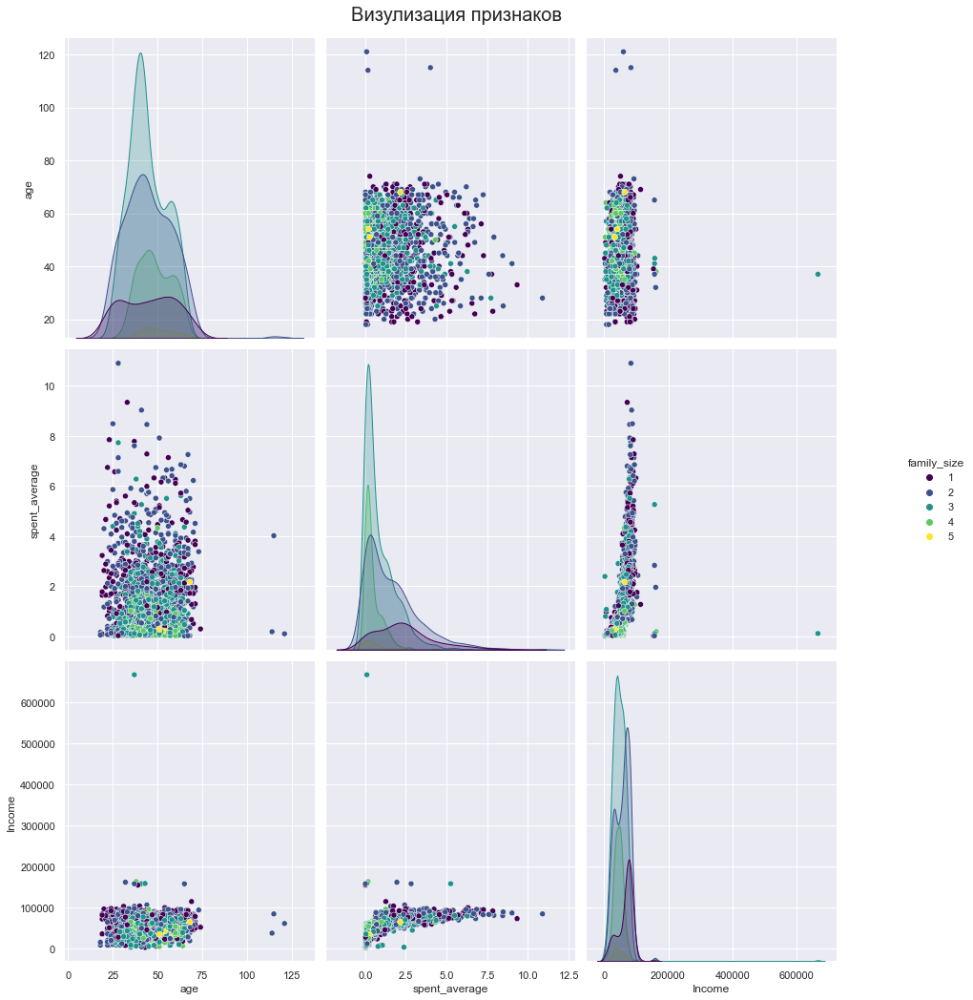

In [897]:
sns.set()
g = sns.pairplot(data_fc, hue='family_size', palette='viridis')
g.fig.set_size_inches(15,15)
g.fig.suptitle('Визулизация признаков', y=1.01, fontsize=20);

*Проверим пропуски*

In [898]:
data_fc.isna().any()

age              False
family_size      False
spent_average    False
Income            True
dtype: bool

In [899]:
data_fc['Income'].isna().sum() / data_fc.shape[0]

0.010714285714285714

*Пропуски есть только в колонке `Income`, у 1% пользователей. Их можно удалить, так как они не должны участвовать в кластеризации*

In [ ]:
data_fc.dropna(inplace=True)

*Есть выбросы по возрасту, доходу и средним расходам, хорошо заметные на точечных графиках, уберем их*

In [901]:
data_fc = data_fc[data_fc['age'] < 80]
data_fc = data_fc[data_fc['spent_average'] < 10]
data_fc = data_fc[data_fc['Income'] < 200000]

*Так как признак `Income` отличается от других на несколько порядков, используем стандартизацию*

In [902]:
std_features = StandardScaler().fit_transform(data_fc.values)
data_fc_std = pd.DataFrame(std_features, index=data_fc.index, columns=data_fc.columns)

Есть ли в полученных данных пропуски? Если да, то насколько много, можно ли их удалить?

*Сделано в шаге выше*

Перейдем к кластеризации клиентов. Какой метод кластеризации будете использовать и почему? Как определить оптимальное количество кластеров или, в зависимости от метода, других гиперпараметров?

*Для начала я буду использовать метод K-means, так как убраны выбросы и данные стандартизованы, и не должно быть проблем с евклидовым расстоянием, и значит качество кластеризации должно быть нормальным* 

*P.S В целом, нет конкретных гайдлайнов, какой метод использовать.*

*Для определения колчества кластеров (гиперпараметра) попробуем воспользоваться коэффициентом силуэта*

In [903]:
from sklearn.metrics import silhouette_score

In [904]:
# rule of thumb для верхней границы количества кластеров 
limit = int((data_fc_std.shape[0]//2)**0.5)

for k in range(2, limit+1):
    model = KMeans(n_clusters=k)
    model.fit(data_fc_std)
    pred = model.predict(data_fc_std)
    score = silhouette_score(data_fc_std, pred)
    print('Коэффициент силуэта для k = {}: {:<.3f}'.format(k, score))

Коэффициент силуэта для k = 2: 0.340
Коэффициент силуэта для k = 3: 0.276
Коэффициент силуэта для k = 4: 0.266
Коэффициент силуэта для k = 5: 0.271
Коэффициент силуэта для k = 6: 0.288
Коэффициент силуэта для k = 7: 0.293
Коэффициент силуэта для k = 8: 0.281
Коэффициент силуэта для k = 9: 0.289
Коэффициент силуэта для k = 10: 0.279
Коэффициент силуэта для k = 11: 0.282
Коэффициент силуэта для k = 12: 0.268
Коэффициент силуэта для k = 13: 0.275
Коэффициент силуэта для k = 14: 0.274
Коэффициент силуэта для k = 15: 0.273
Коэффициент силуэта для k = 16: 0.288
Коэффициент силуэта для k = 17: 0.275
Коэффициент силуэта для k = 18: 0.277
Коэффициент силуэта для k = 19: 0.273
Коэффициент силуэта для k = 20: 0.271
Коэффициент силуэта для k = 21: 0.273
Коэффициент силуэта для k = 22: 0.283
Коэффициент силуэта для k = 23: 0.278
Коэффициент силуэта для k = 24: 0.275
Коэффициент силуэта для k = 25: 0.283
Коэффициент силуэта для k = 26: 0.282
Коэффициент силуэта для k = 27: 0.279
Коэффициент силуэта 

*Видим, что максимальная оценка для 2ух кластеров, но остальные значения все равно достаточно близко. Попробуем визуально оценить кластеризацию с количеством кластеров от 2 до 6.*

Выполните кластеризацию этим методом и подберите оптимальное количество гиперпараметров.

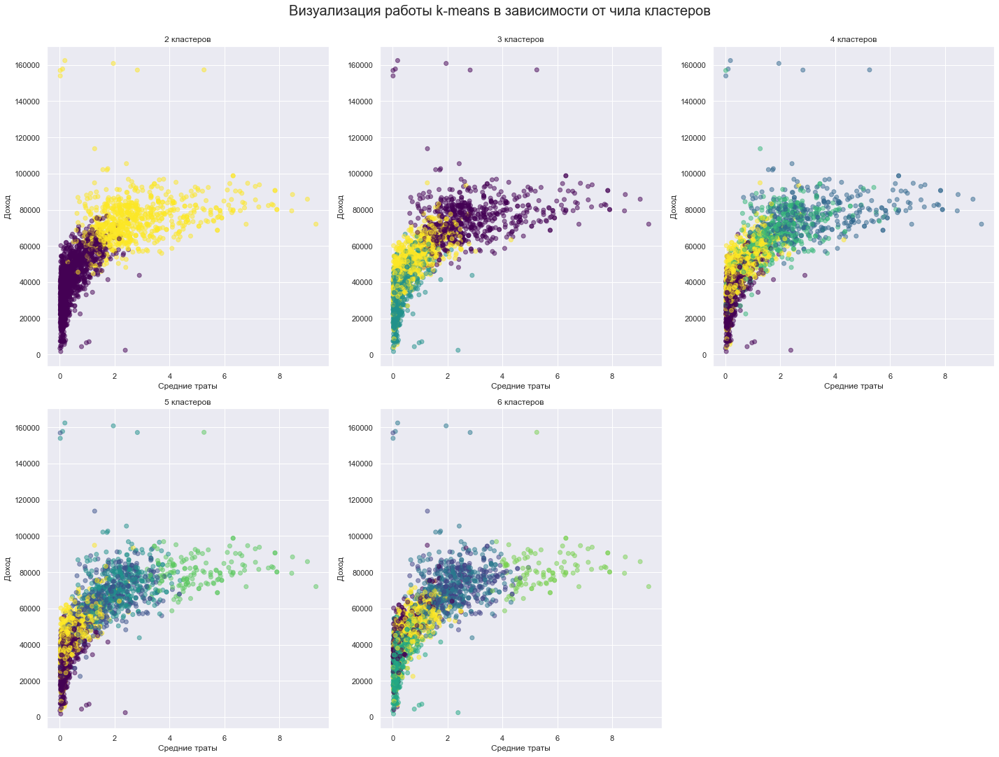

In [905]:
sns.set()
fig = plt.figure(figsize=(20, 15))

for k in range(2, 7):
    model = KMeans(n_clusters=k)
    model.fit(data_fc_std)
    pred = model.predict(data_fc_std)
    plt.subplot(2, 3, k - 1)
    plt.scatter(data_fc['spent_average'], data_fc['Income'], c=pred, alpha=0.5, cmap='viridis')
    plt.title(f'{k} кластеров')
    plt.xlabel('Средние траты')
    plt.ylabel('Доход')
    fig.suptitle('Визуализация работы k-means в зависимости от чила кластеров', y=1, fontsize=20)
    plt.tight_layout()

*Визуально лучше всего вырисовываются кластеры в случае k=2 и k=3. Возьмем для дальнейшего анализа k=3, так как 2 кластера - слишком простое деление, которое будет менее информативным*

Сколько элементов в каждом из полученных кластеров?

Проинтерпретируйте полученные кластеры с помощью визуального анализа. Используйте различные типы графиков (например, box plot), изученные ранее. По каким признакам кластеры различаются, на сколько? Как можно описать клиентов каждого кластера?

Насколько кластеры соприкасаются друг с другом? Что можно сказать про клиентов на границе кластеров?

In [906]:
sns.set(style='white', font_scale=1.5)

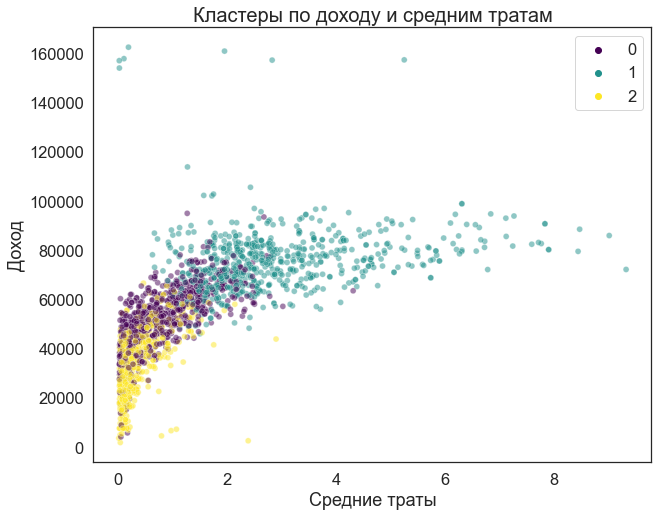

In [907]:
plt.figure(figsize=(10, 8))
model = KMeans(n_clusters=3)
model.fit(data_fc_std)
pred = model.predict(data_fc_std)

spl = sns.scatterplot(data_fc['spent_average'], data_fc['Income'], hue=pred, palette='viridis', alpha=0.5)
spl.set_title('Кластеры по доходу и средним тратам', fontsize=20)
spl.set(ylabel='Доход', xlabel='Средние траты')
plt.legend()

*На основании средних расходов и дохода пользователей можно разделить на 3 кластера:*

*- 0: средний доход, средние траты*

*- 1: низкий доход, низкие траты*

*- 2: высокий доход, средние и выские траты*

*Кластеры (по признакам доход и траты) лежат не обособленно, а "перемешаны" на границах. Коэффициент силуэта, который отражает насколько близко каждая точка в одном кластере находится к точкам в соседних кластерах, равен 0.276, при этом наилучшим является коэффициент 1. В базовом случае в моей кластеризации получилось, что доход пользователя прямо пропорционален тратам на сервисе. Но у клиентов на границах кластеров такая зависимость нарушается - например, он может относиться к кластеру с низким доходом (1), при этом на сервисе он тратит больше, чем в среднем пользователи его кластера (как клиенты из кластера 0). Либо наоборот (это хорошо видно на крайних точках кластера 1) - у пользователя средние доходы, но он почти не пользуется сервисом. Такие случаи возможны, и в реальности они могут образовывать отдельную группу пользователей.*

In [908]:
data_fc['cluster'] = pred

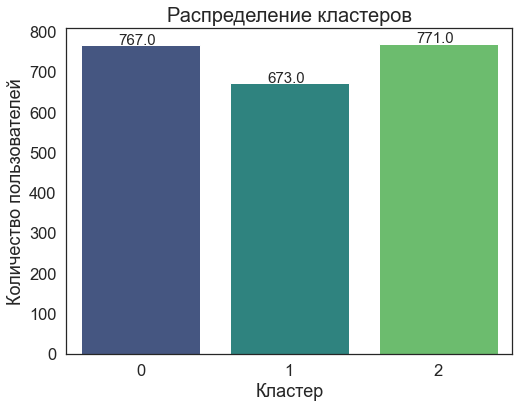

In [909]:
plt.figure(figsize=(8, 6))

cpl = sns.countplot(x='cluster', data=data_fc, palette='viridis')
for p in cpl.patches:
    cpl.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+1.5), fontsize=15)
cpl.set(ylabel='Количество пользователей', xlabel='Кластер')
cpl.set_title("Распределение кластеров", fontsize=20);

*Видим, что в 0 и 1 кластере примерно одинаковое количество пользователей, а во 2 - наименьшее.*

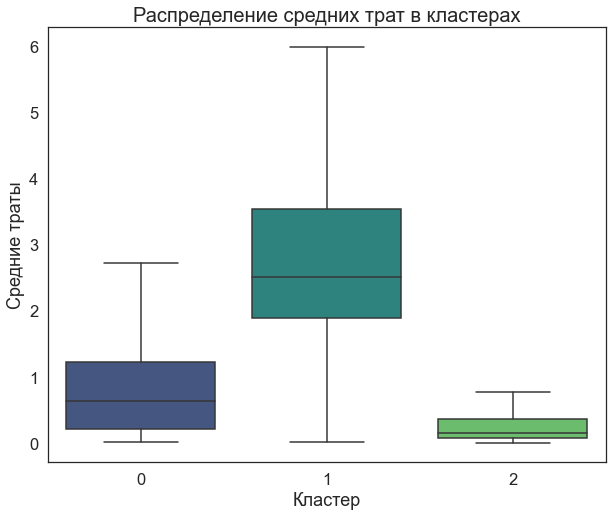

In [910]:
plt.figure(figsize=(10, 8))

bpl = sns.boxplot(x='cluster', y='spent_average', data=data_fc, palette='viridis', showfliers=False)
bpl.set(ylabel='Средние траты', xlabel='Кластер')
bpl.set_title('Распределение средних трат в кластерах', fontsize=20);

*На boxplot видно, что больше на сервисе всего тратят денег клиенты 2го кластера*

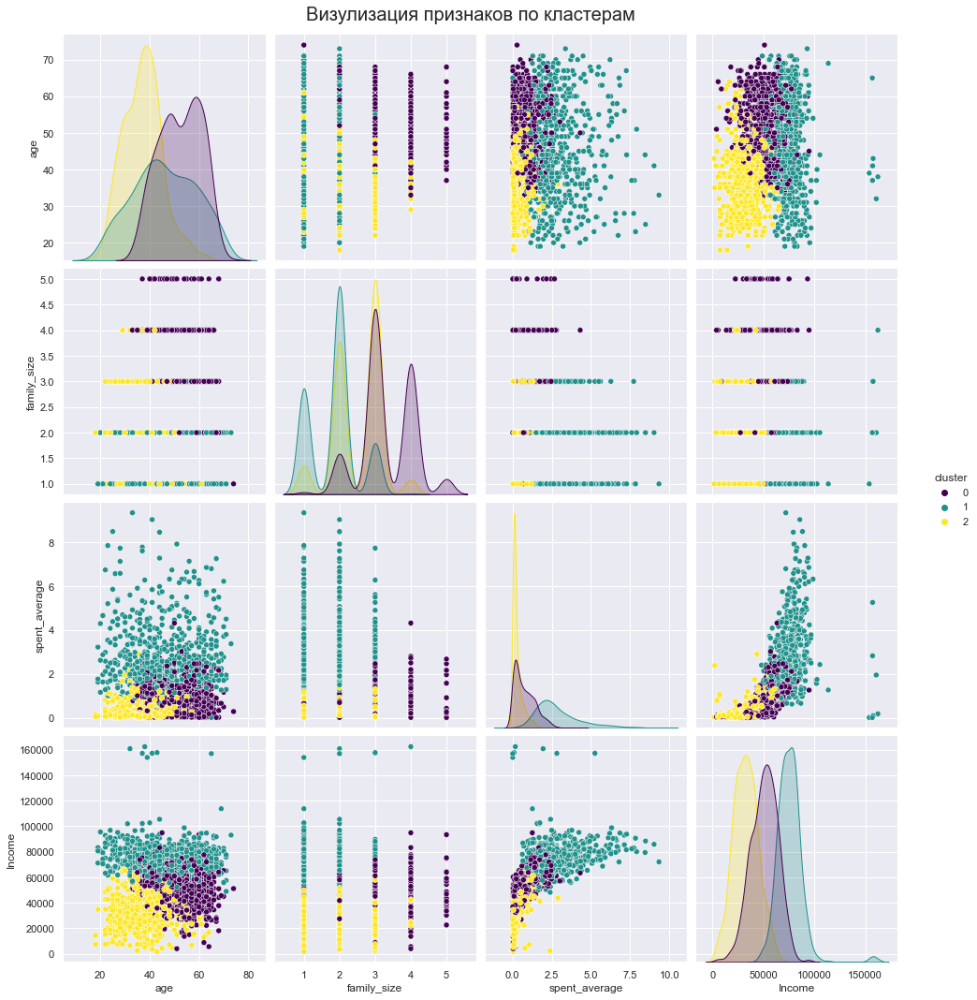

In [911]:
sns.set()
g = sns.pairplot(data_fc, hue='cluster', palette='viridis')
g.fig.set_size_inches(15,15)
g.fig.suptitle('Визулизация признаков по кластерам', y=1.01, fontsize=20);

*По pairplot видим, что ко 2 кластеру (больше всего тратят денег на сервисе) относятся клиенты всех возрастных групп и небольшие семьи до 3х человек, а вот к кластеру 1(низкие траты) в основном относятся молодые клиенты и клиенты среднего возраста - до 50 лет, и также небольшие семьи. Клиенты с семьями от 3х человек в основном относятся к 0 кластеру со средними тратами на сервисе.*

In [912]:
sns.set(style='white', font_scale=1.5)

In [913]:
prom_data = data[['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2']].loc[data_fc.index]
prom_data['accepted_total'] = prom_data.sum(axis=1)

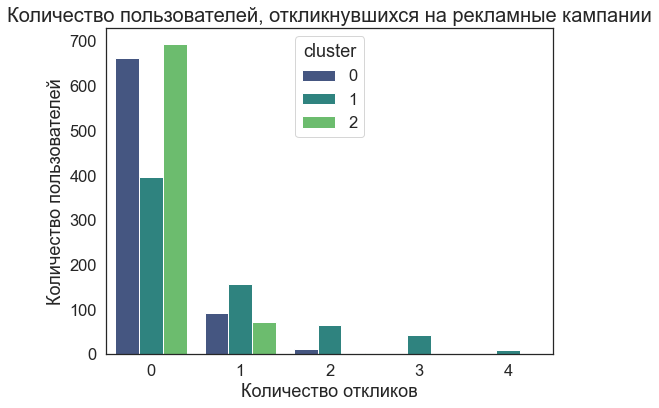

In [914]:
plt.figure(figsize=(8, 6))

ppl = sns.countplot(x='accepted_total', data=prom_data, hue=data_fc['cluster'], palette='viridis')
ppl.set(ylabel='Количество пользователей', xlabel='Количество откликов')
ppl.set_title('Количество пользователей, откликнувшихся на рекламные кампании', fontsize=20);

*Клиенты всех кластеров слабо откликаются на специальные предложения - абсолютное большинство не сделали это ни разу. При этом среди тех кто отликался хотя бы 1 раз ожидаемо больше клиентов 2го кластера, так как у них наибольшие расходы* 

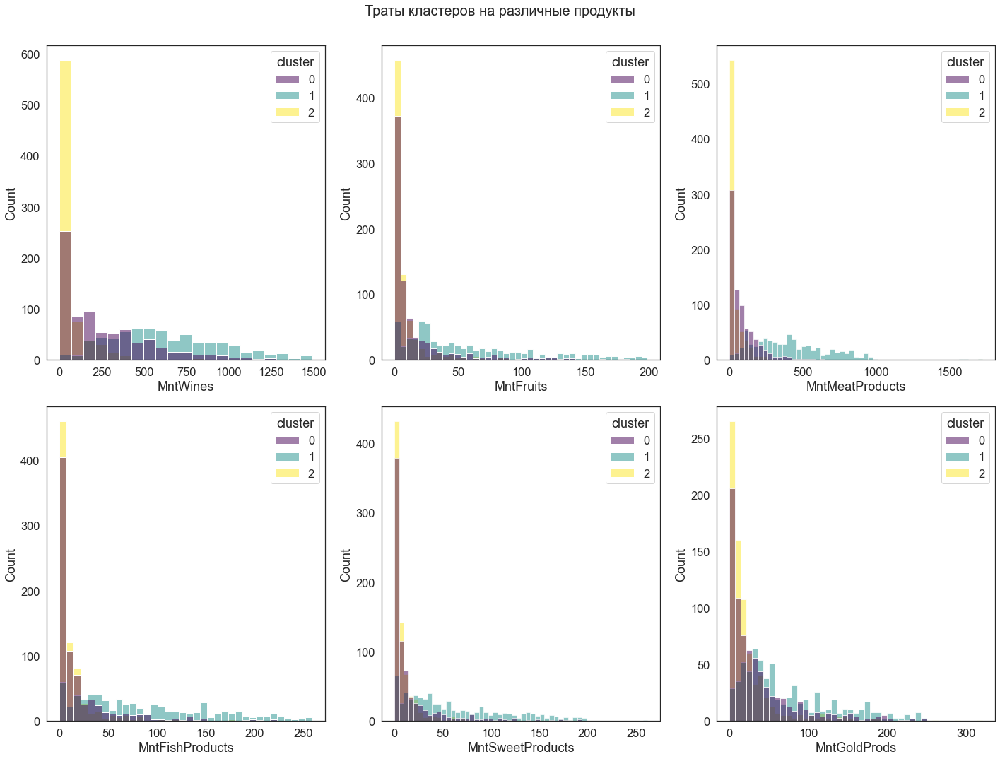

In [915]:
purch_cols = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']

fig = plt.figure(figsize=(20, 15))
purch_data = data[purch_cols].loc[data_fc.index]

for k in range(2, 8):
    plt.subplot(2, 3, k - 1)
    sns.histplot(x=purch_data[purch_cols[k-2]], hue=data_fc['cluster'], palette='viridis')
    fig.suptitle('Траты кластеров на различные продукты', y=1, fontsize=20)
    plt.tight_layout()

*Комментарий в выводе*

Попробуйте также применить другие изученные методы кластеризации. Насколько лучше или хуже получился результат?

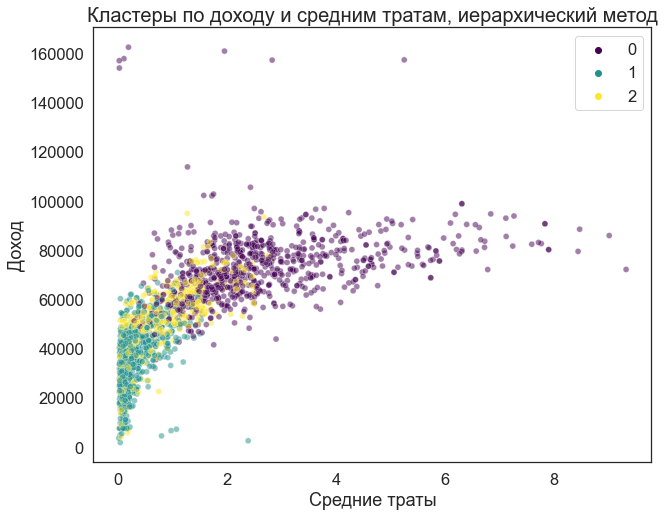

In [916]:
fig = plt.figure(figsize=(10, 8))
AC = AgglomerativeClustering(n_clusters=3)
AC_pred = AC.fit_predict(data_fc_std)
spl = sns.scatterplot(data_fc['spent_average'], data_fc['Income'], hue=AC_pred, palette='viridis', alpha=0.5)
spl.set_title('Кластеры по доходу и средним тратам, иерархический метод', fontsize=20)
spl.set(ylabel='Доход', xlabel='Средние траты')
plt.legend();

*Результат кластеризации получился очень похожим, но визуально уже: средний кластер разбросан сильнее.*

In [917]:
score = silhouette_score(data_fc_std, AC_pred)

print('Коэффициент силуэта для иерархического метода: {:<.3f}'.format(score))

Коэффициент силуэта для иерархического метода: 0.242


*Действительно, коэффициент силуэта ниже, чем в методе K-Means.*

Не забывайте про выводы.

***Выводы***

*На основании кластеризации выделили 3 основных группы пользователей:*

*0) Пользователи со средним доходом, средними тратами на сервисе. У них чаще чем большая семья от 3 человек, возраст средний и чаще пожилой. Реже всего они покупают фрукты и рыбу*

*1) Пользователи с низким доходом, низкими тратами на сервисе. У них в основном семьи до 3 человек. Это молодые клиенты и клиенты среднего возраста. Реже всего они покупают вино и мясные продукты*

*2) Пользователи с высоким доходом, высокими тратами на сервисе. У них в основном семьи до 3 человек. Это клиенты всех возрастов. У них относительно большие расходы на вино, мясные продукты, рыбу. Они намного чаще чем остальные откликались на рекламные предложения.*

*В целом, кластеризация получилась не особо подробной - скорее всего должно быть больше групп пользователей, так как кластеры лежат очень близко друг к другу и крайние точки сильно перемешаны.*